# Projet de Deep Learning : 
## Colorisation d'images en niveaux de gris

<div style="background-color: rgba(255, 255, 0, 0.15); padding: 8px;">

Projet mené par Oriane Longeron et Killian Heim.

Biblio :
- http://archives.univ-biskra.dz/bitstream/123456789/27708/1/BOUREBATE_Hamza.pdf
</div>

### Imports

In [1]:
import os

import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm

from zipfile import ZipFile

import pickle

import cv2

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, concatenate, Input, Lambda
import tensorflow as tf

from tensorflow.keras.models import Model

### Chargement des sets enregistrés

In [10]:
with open("sets.pkl", "rb") as f:
    data = pickle.load(f)

X_train = data["X_train"]
Y_train = data["Y_train"]

X_val = data["X_val"]
Y_val = data["Y_val"]

X_test = data["X_test"]
Y_test = data["Y_test"]

### Choix du dataset

<div class="alert alert-warning" style="margin-top: 0px">

On utilise la base de données Raise1K qui contient 1000 images de contextes variés. L'ensemble des données est de petite taille mais suffisamment grand pour un projet de moyenne envergure. <br>
Nous avons utilisé 70% des images pour l'entrainement et 15% des images pour la validation. Les images restantes sont utilisées pour le test.

</div>

### Prétraitement des données : conversion en niveaux de gris

<div class="alert alert-warning" style="margin-top: 0px">

Ci-dessous, une fonction permettant de convertir une image rgb en une image en niveaux de gris :

</div>

In [3]:
def rgb2gray(im_path):
    """
    Convertit une image RGB en niveaux de gris.

    Args: 
    * im_path: tableau multidimensionnel représentant l'image (h, w, 3)
    
    Return : version en niveaux de gris de l'image (h, w, 3)
    """

    # Chargement de l'image
    img = load_img(im_path)

    # Tableau NumPy
    img_array = img_to_array(img)

    # Conversion en niveaux de gris
    gray_img = np.dot(img_array[...,:3], [0.29893602, 0.58704307, 0.11402090])

    # Répétition le niveau de gris sur 3 canaux
    gray_img = np.stack([gray_img] * 3, axis=-1)

    return gray_img

<div class="alert alert-warning" style="margin-top: 0px">

On conserve les images colorées, les "targets", dans un sous-dossier "color", et on converti ces images en images en niveaux de gris dans un sous dossier "gray", pour le train set :

</div>

In [ ]:
# train_color_dir = 'RAISE1K/train/color'  # Dossier contenant les images colorées
# train_gray_dir = 'RAISE1K/train/gray'  # Dossier pour sauvegarder les images en niveaux de gris

# # Création des dossiers de destination s'ils n'existent pas
# os.makedirs(train_gray_dir, exist_ok=True)

# with tqdm(os.listdir(train_color_dir), desc=f"Conversion", unit="it") as pbar:
#     for filename in pbar:
#         if filename.endswith('.png'):
#             # Chargement de l'image colorée
#             img_path = os.path.join(train_color_dir, filename)
            
#             # Conversion l'image en niveaux de gris
#             img_gray = rgb2gray(img_path)
            
#             # Sauvegarde de l'image en niveaux de gris
#             gray_filename = os.path.join(train_gray_dir, filename)
#             save_img(gray_filename, img_gray)

<div class="alert alert-warning" style="margin-top: 0px">

Nous avons appliqué le même code sur le test set et sur le val set.

</div>

### Exctraction des données et preprocess : création des ensembles train, val, test

In [4]:
def extract_zip(zip_path, extract_to=''):
    """
    Extrait un fichier ZIP.

    Args:
    * zip_path (string): Chemin du fichier ZIP.
    """
    with ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    print(f"Fichiers extraits")

<div class="alert alert-warning" style="margin-top: 0px">

Dans la fonction suivante, on créé les train, val et test sets ainsi que leurs cibles après preprocess (redimentionnement des images au format 256x256 et normalisation).

</div>

In [53]:
def load_and_preprocess_images(input_dir, target_size=(256, 256)):
    """
    Charge les images en niveaux de gris et en couleur, les redimensionne et les organise en X et Y.

    Args: 
    * input_dir (string): Répertoire d'entrée contenant les sous-dossiers 'train', 'valid', 'test'.
    * target_size (tuple): Taille cible pour le redimensionnement.
    
    Return : X (entrées), Y (cibles), sous forme de tableaux numpy.
    """

    extract_zip(input_dir + ".zip")

    X = {"train": [], "val": [], "test": []}  # images niveaux de gris (entrées)
    Y = {"train": [], "val": [], "test": []}  # images colorées (cibles)
    
    # On parcours les sous-dossiers 'train', 'val', 'test'
    for subset in ['train', 'val', 'test']:
        gray_dir = os.path.join(input_dir, subset, 'gray') 
        color_dir = os.path.join(input_dir, subset, 'color')
        
        # Chargement des images en niveaux de gris et colorées
        gray_files = os.listdir(gray_dir)
        color_files = os.listdir(color_dir)
        
        with tqdm(zip(gray_files, color_files), desc=f"Création du {subset} set", unit="image") as pbar:
            for gray_file, color_file in pbar:
                gray_path = os.path.join(gray_dir, gray_file)
                color_path = os.path.join(color_dir, color_file)
                
                # Chargement et redimensionnement de l'image en niveaux de gris
                gray_img = cv2.imread(gray_path, cv2.IMREAD_GRAYSCALE)
                gray_img = cv2.resize(gray_img, target_size, interpolation=cv2.INTER_CUBIC)
                X[subset].append(gray_img / 255) # normalisation des images
                
                # Chargement et redimensionnement de l'image colorée
                color_img = cv2.imread(color_path) 
                color_img = cv2.resize(color_img, target_size, interpolation=cv2.INTER_CUBIC)
                color_img = cv2.cvtColor(color_img, cv2.COLOR_BGR2RGB) # Convertir de BGR à RGB pour éviter les inversions de couleur
                Y[subset].append(color_img / 255)
          
    return np.array(X["train"]), np.array(Y["train"]), np.array(X["val"]), np.array(Y["val"]), np.array(X["test"]), np.array(Y["test"])

In [54]:
input_dir = 'RAISE1K'

X_train, Y_train, X_val, Y_val, X_test, Y_test = load_and_preprocess_images(input_dir)

Fichiers extraits


Création du train set: 700image [06:28,  1.80image/s]
Création du val set: 150image [01:08,  2.18image/s]
Création du test set: 150image [02:14,  1.12image/s]


### Enregistrement des sets

<div class="alert alert-warning" style="margin-top: 0px">

Le code suivant permet de conserver les ensembles comme on les a construit, au cas où on ferme le notebook.

</div>

In [57]:
data = {"X_train": X_train, "Y_train": Y_train,
        "X_val": X_val, "Y_val": Y_val,
        "X_test": X_test, "Y_test": Y_test}

with open("sets.pkl", "wb") as f:
    pickle.dump(data, f)

### Quelques exemples d'images 

In [18]:
def show_examples(imgs, title=''):
    """
    Plots d'ig images dans une grille numx10.
    
    Args:
        images (list): Liste des images.
    """
    if len(imgs) % 5 != 0:
        raise ValueError("La liste doit être de longueur un multiple de 5.")
    
    fig, axes = plt.subplots(len(imgs) // 5, 5, figsize=(15, int(0.7 * len(imgs))))
    axes = axes.ravel()  # Applati la grille 2D en un tableau 1D
    
    for i in range(len(imgs)):
        
        axes[i].imshow(imgs[i], cmap='gray')
        axes[i].axis('off')
   
    fig.suptitle(title)
    plt.tight_layout()
    plt.show()

<div class="alert alert-warning" style="margin-top: 0px">

On affiche quelques exemples des images de la base de données :

</div>

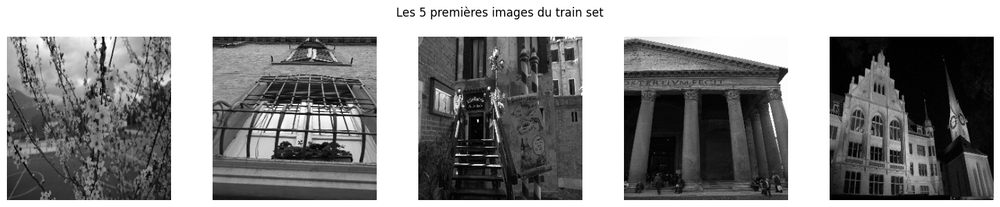

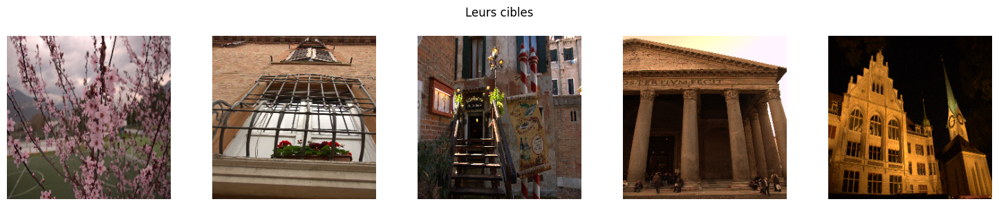

In [4]:
show_examples(X_train[:5], "Les 5 premières images du train set")
show_examples(Y_train[:5], "Leurs cibles")

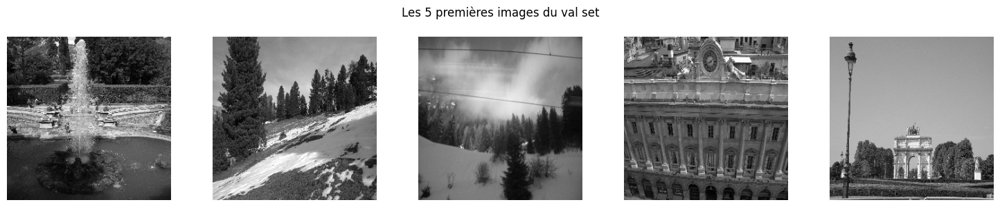

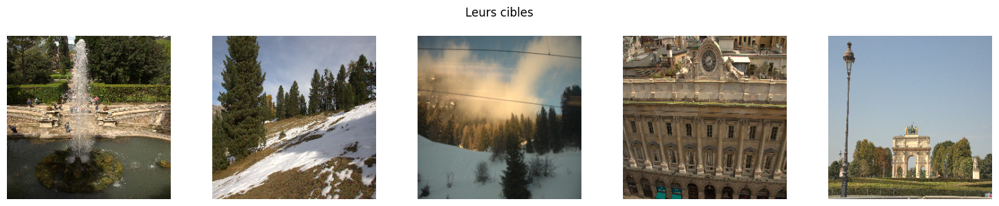

In [5]:
show_examples(X_val[:5], "Les 5 premières images du val set")
show_examples(Y_val[:5], "Leurs cibles")

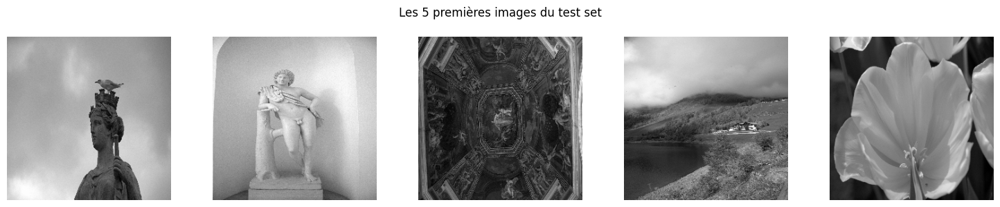

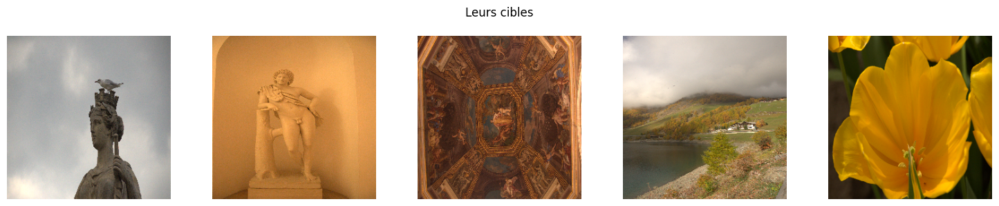

In [6]:
show_examples(X_test[:5], "Les 5 premières images du test set")
show_examples(Y_test[:5], "Leurs cibles")

### Un premier modèle simple : CNN

<div class="alert alert-warning" style="margin-top: 0px">

Nous avons vu en cours que les réseaux de neurones convolutionnels (CNN) sont bien adaptés aux problèmes de traitement d'image car ils sont spécifiquement conçus pour traiter des données structurées en deux ou trois dimensions. <br>
De plus, les images possèdent une structure spatiale où les pixels proches partagent souvent des informations contextuelles et les convolutions, utilisées dans les CNN, permettent de capturer cette information en exploitant les relations locales entre les pixels. Cette caractéristique des CNN est utile pour la colorisation d'images car la couleur d'un pixel peut avoir un lien avec la couleur des pixels voisins en fonction du contexte : par exemple, un pixel gris dans une région "ciel" sera probablement coloré en bleu, ce qui dépend du contexte spatial capturé par un CNN. <br>
Cette caractéristique, ainsi que les opérations de pooling qui réduisent la taille tout en conservant l'essentiel de l'information, permettront une compréhension du contexte global pour choisir des couleurs cohérentes (par exemple, le ciel est souvent bleu) et de conserver les détails fins pour éviter une colorisation floue ou incohérente.

Nous réalisons donc un autoencodeur convolutionnel pour reconstruire les images en couleurs à partir des images en niveaux de gris.

</div>

In [7]:
def build_colorization_model_1(input_shape=(256, 256, 1)):
    model = Sequential()

    # Encodeur : Convolutions + MaxPooling
    model.add(Conv2D(64, (3, 3), strides=1, padding="same", activation='relu', input_shape=input_shape))
    model.add(Conv2D(128, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))  # Réduction de la taille par 2

    model.add(Conv2D(256, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))  # Réduction de la taille par 2

    model.add(Conv2D(512, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))  # Réduction de la taille par 2

    # Décodeur : Convolutions + UpSampling
    model.add(Conv2D(512, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(UpSampling2D(size=(2, 2)))  # Agrandissement de la taille par 2

    model.add(Conv2D(256, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(UpSampling2D(size=(2, 2)))  # Agrandissement de la taille par 2

    model.add(Conv2D(128, (3, 3), strides=1, padding="same", activation='relu'))
    model.add(UpSampling2D(size=(2, 2)))  # Agrandissement de la taille par 2

    model.add(Conv2D(64, (3, 3), strides=1, padding="same", activation='relu'))

    # Couche de sortie pour prédire les 3 canaux RGB
    model.add(Conv2D(3, (3, 3), strides=1, padding="same", activation="sigmoid"))

    return model

In [8]:
model_1 = build_colorization_model_1()
model_1.summary()

c:\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 256)  │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 128)  │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 256, 256, 3)    │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,460,099 (20.83 MB)

 Trainable params: 5,460,099 (20.83 MB)

 Non-trainable params: 0 (0.00 B)

In [9]:
model_1.compile(loss='mse', optimizer='Adam', metrics=['Accuracy'])

In [10]:
batch_size = 50
ntrain = len(X_train)
nval = len(X_val)

train_datagen = ImageDataGenerator() 
val_datagen = ImageDataGenerator() # On ne fait pas d'augmentation

X_train = np.expand_dims(X_train, axis=-1) # Doit être (n_samples, 256, 256, 1)
X_val = np.expand_dims(X_val, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

#On créé les générateurs d'images
train_generator = train_datagen.flow(X_train, Y_train, batch_size=batch_size)
val_generator = val_datagen.flow(X_val, Y_val, batch_size=batch_size)

In [11]:
history = model_1.fit(train_generator,
                        steps_per_epoch=ntrain // batch_size,
                        epochs=20,
                        validation_data=val_generator,
                        validation_steps=nval // batch_size)


Epoch 1/20


c:\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 480s 34s/step - Accuracy: 0.5625 - loss: 0.0766 - val_Accuracy: 0.6557 - val_loss: 0.0503
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 510s 37s/step - Accuracy: 0.6452 - loss: 0.0365 - val_Accuracy: 0.5239 - val_loss: 0.0205
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 469s 33s/step - Accuracy: 0.5818 - loss: 0.0212 - val_Accuracy: 0.6542 - val_loss: 0.0183
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 476s 34s/step - Accuracy: 0.6468 - loss: 0.0181 - val_Accuracy: 0.5993 - val_loss: 0.0167
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 473s 34s/step - Accuracy: 0.6361 - loss: 0.0167 - val_Accuracy: 0.6142 - val_loss: 0.0159
Epoch 6/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 464s 33s/step - Accuracy: 0.6463 - loss: 0.0157 - val_Accuracy: 0.6544 - val_loss: 0.0156
Epoch 7/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 483s 35s/step - Accuracy: 0.6690 - loss: 0.0153 - val_Accuracy: 0.6546 - val_loss: 0.0148
Epoch 8/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 480s 34s/step - Accuracy: 0.6702 - loss: 0.0143 - val_Accuracy: 0.6249 - val_

In [13]:
model_1.save('premier_modele.h5')

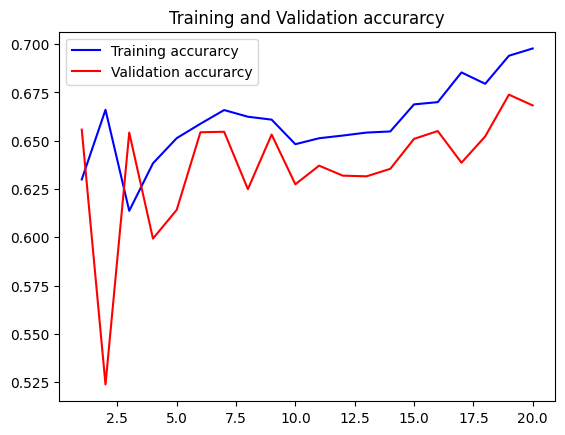

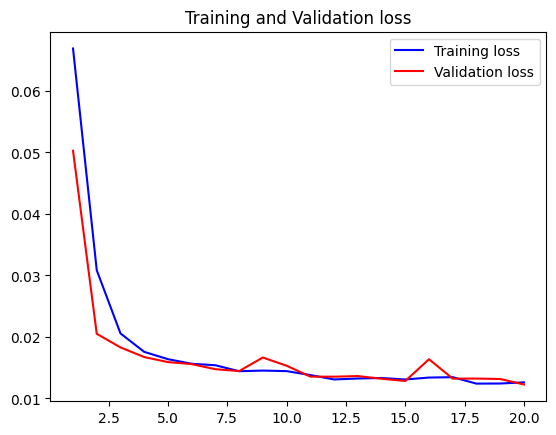

In [15]:
#lets plot the train and val curve
#get the details form the history object
acc = history.history['Accuracy']
val_acc = history.history['val_Accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

#Train and validation accuracy
plt.plot(epochs, acc, 'b', label='Training accurarcy')
plt.plot(epochs, val_acc, 'r', label='Validation accurarcy')
plt.title('Training and Validation accurarcy')
plt.legend()
plt.figure()

#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

In [25]:
test_datagen = ImageDataGenerator()
pred = []

for i, batch in enumerate(test_datagen.flow(X_test, batch_size=1, shuffle=False)):
    pred.append(model_1.predict(batch))
    print(len(pred))

    # Stopper la boucle lorsque toutes les images ont été traitées
    if i >= len(X_test) - 1:
        break

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step
1
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step
2
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step
4
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
6
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
7
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
8
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
9
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
11
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 553ms/step
12
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
14
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
15
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
16
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
17
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
18
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step
19
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step
20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
21
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step
22
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step
24
1

In [ ]:
pred = [np.squeeze(pred[k], axis=0) for k in range(len(pred))]

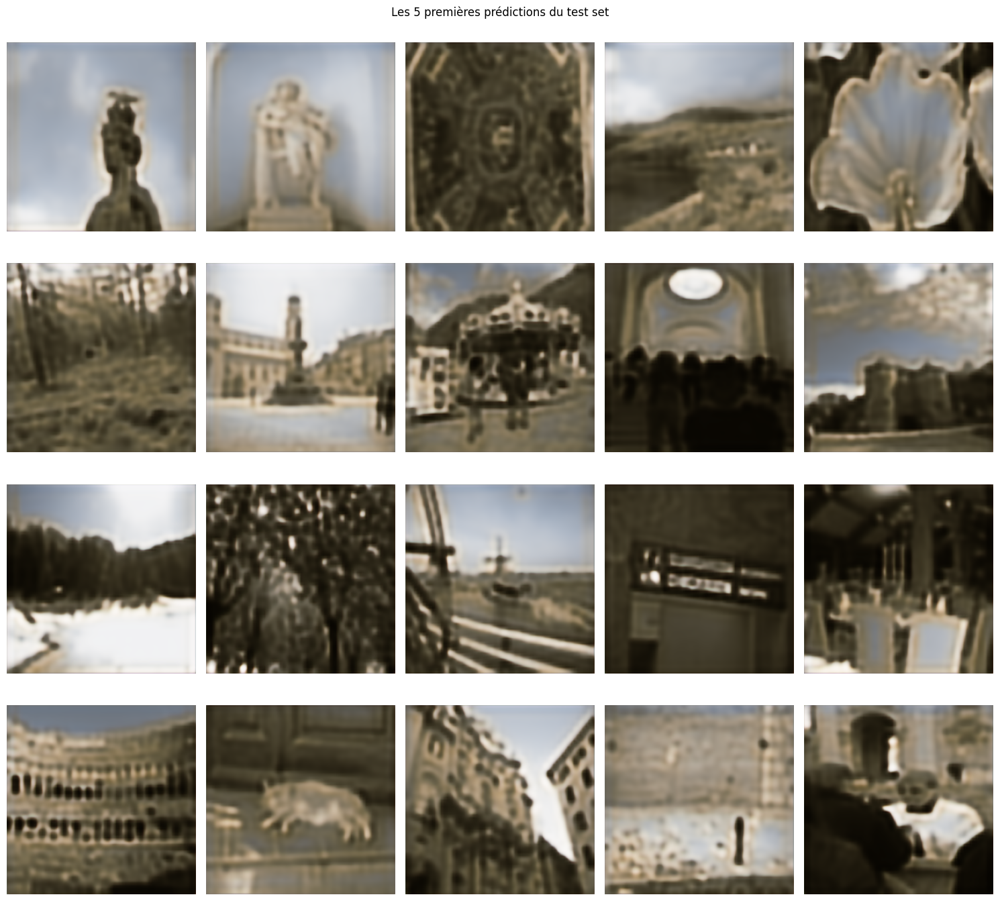

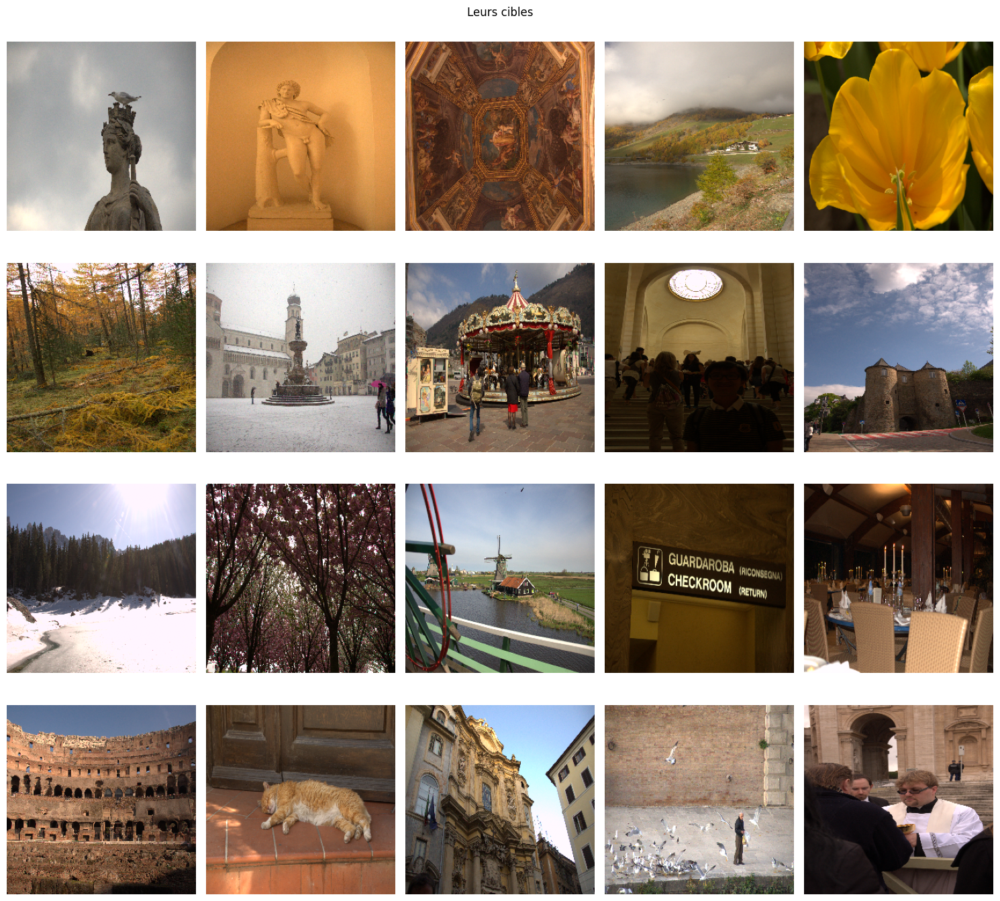

In [36]:
show_examples(pred[:20], "Les 5 premières prédictions du test set")
show_examples(Y_test[:20], "Leurs cibles")

### Autre méthode

<div class="alert alert-warning" style="margin-top: 0px">

On ne converti plus les données en noir et blanc tout de suite. On converti les images de RGB vers lab. On utilisera une tanh comme fonction d'activation sur la dernière couche (trouver pourquoi).

</div>

In [4]:
def convert_to_lab(image):
    """
    Convertit une images RGB en LAB et retourne les canaux L (X) et AB (Y).
    Args:
        images (numpy array): Image RGB.
    Returns:
        X (numpy array): Canal L (entrée).
        Y (numpy array): Canaux A et B (cibles).
    """

    # Convertir l'image RGB en LAB
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    
    # Extraire les canaux L, A, et B
    L, A, B = cv2.split(lab)
    
    # Normaliser L, A et B entre [0, 1]
    L = L / 255.0
    A = A / 128.0  # A va de -128 à 127
    B = B / 128.0  # B va de -128 à 127

    return L, np.stack((A, B), axis=-1) # Combiner A et B en une seule matrice

In [5]:
def load_and_preprocess_images_lab(input_dir, target_size=(256, 256)):
    """
    Charge les images en niveaux de gris et en couleur, les redimensionne et les organise en X et Y.

    Args: 
    * input_dir (string): Répertoire d'entrée contenant les sous-dossiers 'train', 'valid', 'test'.
    * target_size (tuple): Taille cible pour le redimensionnement.
    
    Return : X (entrées), Y (cibles), sous forme de tableaux numpy.
    """

    #extract_zip(input_dir + ".zip")

    X = {"train": [], "val": [], "test": []}  # images niveaux de gris (entrées)
    Y = {"train": [], "val": [], "test": []}  # images colorées (cibles)
    
    # On parcours les sous-dossiers 'train', 'val', 'test'
    for subset in ['train', 'val', 'test']:
        dir = os.path.join(input_dir, subset)
        
        # Chargement des images en niveaux de gris et colorées
        files = os.listdir(dir)
        
        with tqdm(files, desc=f"Création du {subset} set", unit="image") as pbar:
            for file in pbar:
                path = os.path.join(dir, file)
                
                img = cv2.imread(path) 
                gray_img, color_img = convert_to_lab(img)
                
                X[subset].append(gray_img)
                Y[subset].append(color_img)
          
    return np.array(X["train"]), np.array(Y["train"]), np.array(X["val"]), np.array(Y["val"]), np.array(X["test"]), np.array(Y["test"])

In [3]:
input_dir = 'RAISE1K_Lab'

X_train, Y_train, X_val, Y_val, X_test, Y_test = load_and_preprocess_images_lab(input_dir)

NameError: name 'load_and_preprocess_images_lab' is not defined

In [ ]:
show_examples(X_train[:5], "Les 5 premières images du train set")
show_examples(Y_train[:5], "Leurs cibles")

In [9]:
def build_unet(input_shape=(256, 256, 1)):
    # Entrée
    inputs = Input(shape=input_shape)

    # Encodeur
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    c1 = Conv2D(64, (3, 3), activation='relu', padding='same')(c1)
    p1 = MaxPooling2D(pool_size=(2, 2))(c1)

    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(p1)
    c2 = Conv2D(128, (3, 3), activation='relu', padding='same')(c2)
    p2 = MaxPooling2D(pool_size=(2, 2))(c2)

    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(p2)
    c3 = Conv2D(256, (3, 3), activation='relu', padding='same')(c3)
    p3 = MaxPooling2D(pool_size=(2, 2))(c3)

    # Goulot
    bottleneck = Conv2D(512, (3, 3), activation='relu', padding='same')(p3)
    bottleneck = Conv2D(512, (3, 3), activation='relu', padding='same')(bottleneck)

    # Décodeur
    u1 = UpSampling2D(size=(2, 2))(bottleneck)
    u1 = Conv2D(256, (3, 3), activation='relu', padding='same')(u1)
    u1 = Conv2D(256, (3, 3), activation='relu', padding='same')(u1)

    u2 = UpSampling2D(size=(2, 2))(u1)
    u2 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)
    u2 = Conv2D(128, (3, 3), activation='relu', padding='same')(u2)

    u3 = UpSampling2D(size=(2, 2))(u2)
    u3 = Conv2D(64, (3, 3), activation='relu', padding='same')(u3)
    u3 = Conv2D(64, (3, 3), activation='relu', padding='same')(u3)

    # Sortie
    outputs = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(u3)  # 3 canaux pour RGB

    # Modèle
    model = Model(inputs, outputs, name="U-Net")
    return model


In [11]:
# Initialisation du modèle
model = build_unet(input_shape=(256, 256, 1))

# Compilation du modèle
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 64, 64, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 256)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 128, 128, 128)  │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 256, 256, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 256, 256, 3)    │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,009,283 (26.74 MB)

 Trainable params: 7,009,283 (26.74 MB)

 Non-trainable params: 0 (0.00 B)

In [12]:
batch_size = 50
ntrain = len(X_train)
nval = len(X_val)

train_datagen = ImageDataGenerator() 
val_datagen = ImageDataGenerator() # On ne fait pas d'augmentation

X_train = np.expand_dims(X_train, axis=-1) # Doit être (n_samples, 256, 256, 1)
X_val = np.expand_dims(X_val, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

#On créé les générateurs d'images
train_generator = train_datagen.flow(X_train, Y_train, batch_size=batch_size)
val_generator = val_datagen.flow(X_val, Y_val, batch_size=batch_size)

In [13]:
history = model.fit(train_generator,
                        steps_per_epoch=ntrain // batch_size,
                        epochs=20,
                        validation_data=val_generator,
                        validation_steps=nval // batch_size)

Epoch 1/20


c:\Python310\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


14/14 ━━━━━━━━━━━━━━━━━━━━ 500s 35s/step - accuracy: 0.5200 - loss: 0.0822 - val_accuracy: 0.6556 - val_loss: 0.0500
Epoch 2/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 477s 34s/step - accuracy: 0.6167 - loss: 0.0638 - val_accuracy: 0.6573 - val_loss: 0.0390
Epoch 3/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 499s 36s/step - accuracy: 0.6618 - loss: 0.0356 - val_accuracy: 0.6573 - val_loss: 0.0260
Epoch 4/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 480s 34s/step - accuracy: 0.6790 - loss: 0.0240 - val_accuracy: 0.6572 - val_loss: 0.0238
Epoch 5/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 459s 33s/step - accuracy: 0.6664 - loss: 0.0208 - val_accuracy: 0.6573 - val_loss: 0.0183
Epoch 6/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 457s 33s/step - accuracy: 0.6570 - loss: 0.0181 - val_accuracy: 0.6573 - val_loss: 0.0177
Epoch 7/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 458s 33s/step - accuracy: 0.6651 - loss: 0.0172 - val_accuracy: 0.6483 - val_loss: 0.0160
Epoch 8/20
14/14 ━━━━━━━━━━━━━━━━━━━━ 458s 33s/step - accuracy: 0.6516 - loss: 0.0160 - val_accuracy: 0.6562 - val_

In [15]:
test_datagen = ImageDataGenerator()
pred = []

for i, batch in enumerate(test_datagen.flow(X_test, batch_size=1, shuffle=False)):
    pred.append(model.predict(batch))
    print(len(pred))

    # Stopper la boucle lorsque toutes les images ont été traitées
    if i >= len(X_test) - 1:
        break

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 902ms/step
1
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
2
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 722ms/step
3
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step
4
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 830ms/step
5
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step
6
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 813ms/step
7
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step
8
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
9
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
10
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
11
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
12
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
13
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
14
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
15
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
16
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
17
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
18
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 695ms/step
19
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step
21
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
22
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step
23
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
24
1

In [16]:
pred = [np.squeeze(pred[k], axis=0) for k in range(len(pred))]

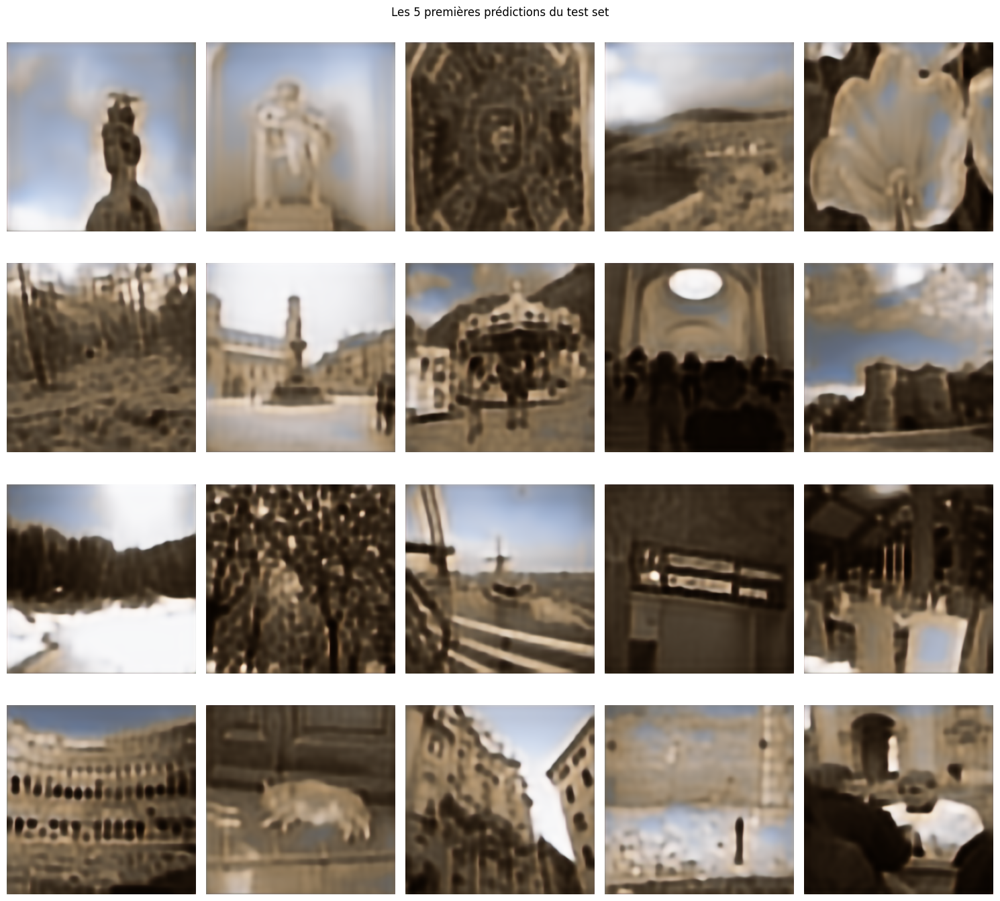

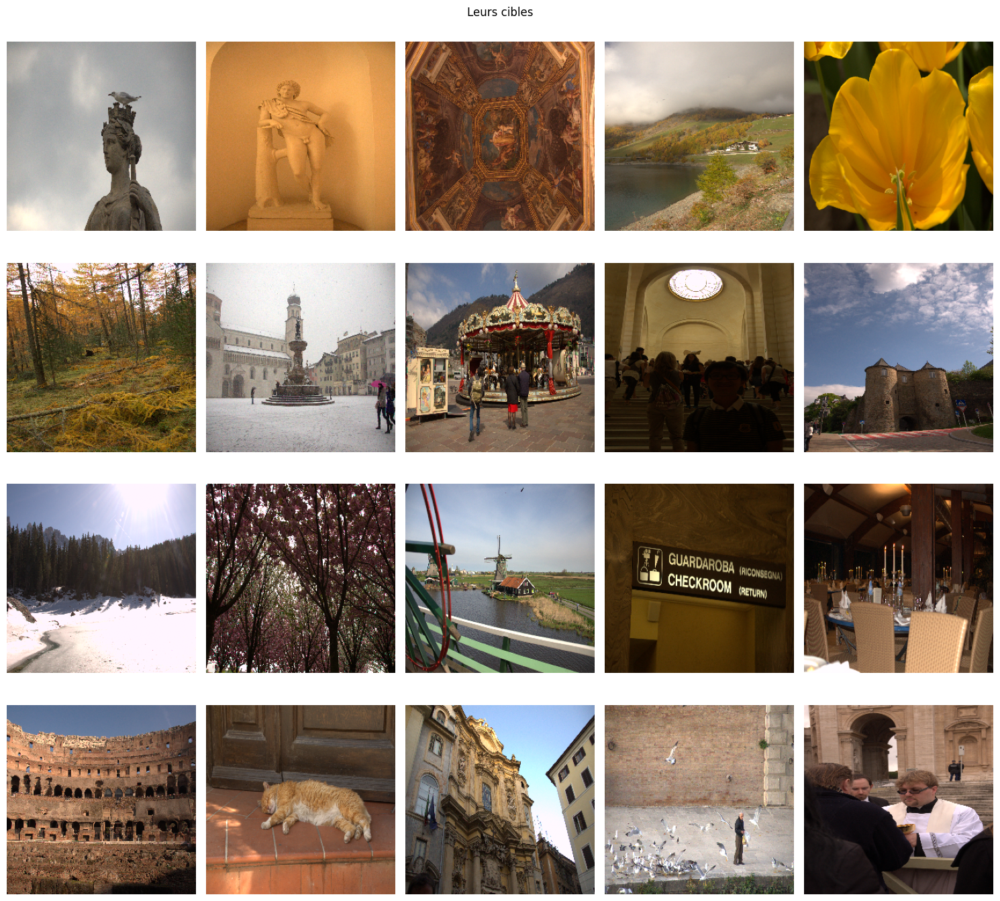

In [19]:
show_examples(pred[:20], "Les 5 premières prédictions du test set")
show_examples(Y_test[:20], "Leurs cibles")